In [11]:
def animate_position_plotly(t: np.ndarray, y: np.ndarray, max_frames: int = 200) -> None:
    idx = np.linspace(0, len(t) - 1, min(max_frames, len(t))).astype(int)

    frames = [
        go.Frame(
            data=[
                go.Scatter(x=t, y=y, mode="lines", name="Position"),
                go.Scatter(x=[t[i]], y=[y[i]], mode="markers", name="Current", marker=dict(size=10)),
            ],
            name=str(i),
        )
        for i in idx
    ]

    fig = go.Figure(
        data=[
            go.Scatter(x=t, y=y, mode="lines", name="Position"),
            go.Scatter(x=[t[idx[0]]], y=[y[idx[0]]], mode="markers", name="Current", marker=dict(size=10)),
        ],
        frames=frames,
    )

    fig.add_hline(y=0.0, line_dash="dash")

    fig.update_layout(
        title="Position Over Time",
        xaxis_title="Time",
        yaxis_title="Position",
        template="plotly_white",
        updatemenus=[
            dict(
                type="buttons",
                showactive=False,
                buttons=[
                    dict(label="Play", method="animate",
                         args=[None, {"frame": {"duration": 30, "redraw": True},
                                      "fromcurrent": True, "transition": {"duration": 0}}]),
                    dict(label="Pause", method="animate",
                         args=[[None], {"frame": {"duration": 0, "redraw": False},
                                        "mode": "immediate", "transition": {"duration": 0}}]),
                ],
            )
        ],
        sliders=[
            dict(
                steps=[dict(method="animate", args=[[f.name], {"mode": "immediate"}], label=f"{t[int(f.name)]:.2f}")
                       for f in frames],
                currentvalue={"prefix": "t = "},
            )
        ],
    )

    fig.show()


In [12]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Tuple

import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp


@dataclass(frozen=True)
class Params:
    """Physical parameters for vertical motion in water."""
    g: float = 9.81                 # m/s^2
    rho: float = 1000.0             # kg/m^3 (water density)
    drag_coeff: float = 2.0         # lumped quadratic drag coefficient

    mass: float = 5.0               # kg
    volume: float = 1.0             # m^3


def buoyant_force(y: float, p: Params) -> float:
    """
    Buoyant force (upward, +) for an object whose top intersects the waterline at y=0.
    Returns force
    """
    if y >= 0.0:
        return 0.0

    submerged_volume = np.clip(-y, 0.0, p.volume)
    return p.rho * submerged_volume * p.g


def rhs(t: float, state: np.ndarray, p: Params) -> np.ndarray:
    """
    Right-hand side of the ODE system:
      state[0] = position y
      state[1] = velocity v
    """
    y, v = state

    f_gravity = -p.mass * p.g
    f_buoyancy = buoyant_force(y, p)
    f_drag = -p.drag_coeff * v * abs(v)   # quadratic drag opposing motion

    f_net = f_gravity + f_buoyancy + f_drag

    dy_dt = v
    dv_dt = f_net / p.mass
    return np.array([dy_dt, dv_dt], dtype=float)


def simulate(
    y0: float,
    v0: float,
    t_span: Tuple[float, float],
    num_points: int,
    p: Params,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Simulate the motion and return (t, y, v)."""
    t_eval = np.linspace(t_span[0], t_span[1], num_points)

    sol = solve_ivp(
        fun=lambda t, s: rhs(t, s, p),
        t_span=t_span,
        y0=np.array([y0, v0], dtype=float),
        t_eval=t_eval,
        rtol=1e-7,
        atol=1e-9,
    )

    if not sol.success:
        raise RuntimeError(f"ODE solver failed: {sol.message}")

    y = sol.y[0]
    v = sol.y[1]
    return sol.t, y, v


def plot_position(t: np.ndarray, y: np.ndarray) -> None:
    """Plot position vs time with the water surface marked."""
    plt.plot(t, y, label="Position")
    plt.axhline(0.0, linestyle="--", label="Water surface")
    plt.xlabel("Time")
    plt.ylabel("Position y")
    plt.title("Position Over Time")
    plt.legend()
    plt.tight_layout()
    plt.show()

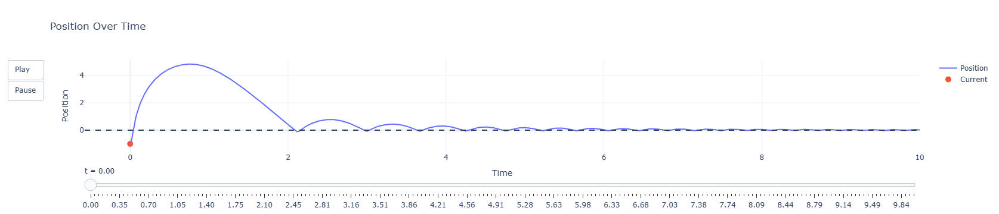

In [14]:
def main() -> None:
    p = Params()

    # Initial conditions (y<0 means below water surface)
    y0 = -1.0
    v0 = 0.0

    # Time settings
    t_span = (0.0, 10.0)
    num_points = 1000

    t, y, _v = simulate(y0=y0, v0=v0, t_span=t_span, num_points=num_points, p=p)
    animate_position_plotly(t, y)

if __name__ == "__main__":
    main()